In [1]:
#import the libraries 
import re
import pandas as pd
import numpy as np
import string
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)

from datetime import datetime
import preprocessor as p
from langdetect import detect
from language_detector import detect_language


import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import TweetTokenizer
from nltk.tokenize import sent_tokenize, word_tokenize
from collections import Counter
import contractions

import gensim
from gensim import corpora
from gensim.models import CoherenceModel
from gensim.utils import simple_preprocess
from gensim.models.ldamodel import LdaModel

import pickle 

import spacy
from spacy.lemmatizer import Lemmatizer
from spacy.lang.en.stop_words import STOP_WORDS
import en_core_web_sm

from wordcloud import WordCloud
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
from pprint import pprint

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.tools as tls


from tqdm import tqdm_notebook as tqdm
import warnings
warnings.filterwarnings('ignore')



# Import the English only request 

In [2]:
#import the english only csv file
amazon_request = pd.read_csv('./datasets/amazon_request_en.csv',lineterminator='\n',index_col=0)
                               #parse_dates=['created_at'])#, index_col='created_at')


In [3]:
#reset the index of the new dateframe 
amazon_request.reset_index(inplace=True)

In [4]:
#roughly check if the dateframe has only english text 
pd.set_option('display.max_colwidth', -1)
amazon_request.text.head(50)

0     @AmazonHelp 3 different people have given 3 different answers and I still don't have my order. Says delivered Saturday, was not, I was home all day               
1     @AmazonHelp I frankly don't have the patience for another chat with your "customer service" people today.                                                         
2     @AmazonHelp Hi ready for some help                                                                                                                                
3     @AmazonHelp Is the Echo Show no longer supported?                                                                                                                 
4     @AmazonHelp Nothing there helped me with the Echo Show                                                                                                            
5     .@AmazonHelp Item has not been delivered but tracking says it was handed to me over an hour ago... 2nd time this has happened. Sort it out https://t.

In [5]:
#roughly check if the dateframe has only english text 
pd.set_option('display.max_colwidth', -1)
amazon_request.text.tail(50)

93633    @AmazonHelp Called up @115850 customer care agent dipika supervisor ajay and manager Sohail is unable to do nothing they said wait for 3 more days you will receive ur product !! Why 3 more days if delivery date is for today ? @118702 @4030 @115851 @132981 @4449                             
93634    @AmazonHelp What about #LGQ6AppQuiz ??                                                                                                                                                                                                                                                            
93635    @AmazonHelp And also where is winner of #OnePlus5TAppQuiz ?                                                                                                                                                                                                                                       
93636    @AmazonHelp No trust left, 3weeks we wasted..\nKeep deals monthly, wid more stock..\nNot su

#### Non English tweets detected!

I found a German tweet in the datset. In this case I need to do the data cleaning first and try the lang detection again. 

In [6]:
#93650    @122924 @AmazonHelp Das Teil ist bei euch angekommen. Damit hat Amazon ja nichts zu tun. Ihr habt den Schaden. Ihr habt zu Ersetzen!   

lang = detect('as Teil ist bei euch angekommen. Damit hat Amazon ja nichts zu tun. Ihr habt den Schaden. Ihr habt zu Ersetzen')
lang

'de'

__Short Summary__ :

I have drop duplicated rows and examine the dataframe in the previous notebook `twitter starter code`
I will bear in mind there are still non english tweets in the dataframe. 

The coming section is Exploratory Data Analysis(EDA). The data cleaning will be performed at the last part of EDA 


## EDA : Examine the date and the number of tweets - When did the tweets create ?

### Examine the range of date of the tweets

I will examine the dataset by the following
- the duration of the dataset 
- the date of first tweet in the dataset
- the date of last tweet in the dateset 
- the average number of tweets per hour

In [7]:
# Overwrite the original 'created_at' column with one that has been converted to a datetime series.
amazon_request['created_at']= pd.to_datetime(amazon_request.created_at)

In [8]:
#use 'created_at'(tweet created date and time) be the index 
amazon_request.set_index(amazon_request['created_at'], inplace=True)   

In [9]:
#sort the datetime in acending order 
amazon_request = amazon_request.sort_index()

In [10]:
# ensure it has been a change to the datatime structure
amazon_request.head(10)

,tweet_id,author_id,inbound,created_at,text
created_at,,,,,
2015-06-13 02:17:56+00:00,648406,274086,True,2015-06-13 02:17:56+00:00,@AmazonHelp here this on my gift card activity balance hold and balance withheld. http://t.co/R3c5NVmMuP
2015-06-26 23:30:09+00:00,369261,203483,True,2015-06-26 23:30:09+00:00,@AmazonHelp Here's why it matters: I need verified reviews to book online promotional services in advance of my eBook release in Aug. Thx.
2015-06-27 05:07:00+00:00,369260,203483,True,2015-06-27 05:07:00+00:00,@AmazonHelp That's exactly what she did. Bought it from Amazon / posted the review. But not thru your email to her. She posted via website.
2015-06-27 16:54:26+00:00,369263,203483,True,2015-06-27 16:54:26+00:00,@AmazonHelp Can she delete her review &amp; resubmit it when she receives follow-up email from Amazon? How long after purchase is email sent?
2015-06-29 20:40:12+00:00,369264,203483,True,2015-06-29 20:40:12+00:00,@AmazonHelp How long after a book purchase does Amazon send a follow-up email requesting a rating/review? I need it to say VERIFIED PURCHASE
2015-07-14 16:04:42+00:00,2933545,811202,True,2015-07-14 16:04:42+00:00,@AmazonHelp i bookd a fostelo women's handbag on 4july bt still it is not delvrd \nexpctd date ws 13july http://t.co/1IEAVE9esC
2015-07-14 17:02:02+00:00,2933544,132991,True,2015-07-14 17:02:02+00:00,@811202 @AmazonHelp i think u should cancel your order arpit and book another on Flipkart. It will deliver ur order in 2-3 working day
2015-07-17 15:01:06+00:00,130746,145514,True,2015-07-17 15:01:06+00:00,@115850 @AmazonHelp ur __email__ seems not working so attaching the proof of mail sent here:\n#BTSOfferSCAM http://t.co/PFHFyLowFj
2015-12-23 22:05:36+00:00,940416,342936,True,2015-12-23 22:05:36+00:00,The sound quality of The Deer Hunter on Amazon Prime on the Xbox is the worst thing I've ever heard. @AmazonHelp @XboxSupport


In [11]:
# ensure it has been a change to the datatime structure and is in acending order
amazon_request.tail(10)

,tweet_id,author_id,inbound,created_at,text
created_at,,,,,
2017-12-03 23:02:56+00:00,603944,263543,True,2017-12-03 23:02:56+00:00,"@AmazonHelp Yet again! These aren't in my safe place, and it was raining, AND my Wife wasn't happy about her plant being flattened! https://t.co/YhMfDXzq6R"
2017-12-03 23:03:48+00:00,603952,129576,True,2017-12-03 23:03:48+00:00,@AmazonHelp You should stop that open delivery thing. You have no right to unbox our package even if cost more than a lakh. This is not done. Flipkart is good at this.
2017-12-03 23:04:08+00:00,602240,262956,True,2017-12-03 23:04:08+00:00,"@AmazonHelp I have done this many times, already, and they refuse to provide any resolution. Sorry, I know there's not really much you can do on Twitter. I feel like I've run out of options, and don't really know what to do, or where go to get any satisfaction. Nobody will help me."
2017-12-03 23:05:36+00:00,603954,263546,True,2017-12-03 23:05:36+00:00,@AmazonHelp Says to contact yourselves about it. I also had my amazon pantry delivery but that was successful. This order now says to contact u for redelivery. #whereismyorder
2017-12-03 23:06:18+00:00,603201,263287,True,2017-12-03 23:06:18+00:00,@AmazonHelp I am lost.. Looked at both sites.. Mobile and full site..
2017-12-03 23:06:27+00:00,513521,164195,True,2017-12-03 23:06:27+00:00,"@AmazonHelp Just like I said. I click on the orders tab, even though it is checked, ALL THE TIME, it makes me click to sign-in. Every. Single. Time."
2017-12-03 23:06:47+00:00,586806,258575,True,2017-12-03 23:06:47+00:00,@AmazonHelp Yes the charge is on my bank account https://t.co/PUtQGyAHpF
2017-12-03 23:07:21+00:00,513454,238166,True,2017-12-03 23:07:21+00:00,@AmazonHelp I called and hopefully the replacements will be in great condition. Thank you for your help!
2017-12-03 23:08:40+00:00,600364,220550,True,2017-12-03 23:08:40+00:00,@AmazonHelp It redirects to https://t.co/0wH5oX1v71


In [12]:
# Add week and Year columns
amazon_request['month'] = amazon_request['created_at'].dt.strftime('%b')
amazon_request['year'] = amazon_request['created_at'].dt.strftime('%Y')
amazon_request['dayname']= amazon_request['created_at'].dt.day_name()

In [13]:
#ensure the columns are added corrctly
amazon_request.head(10)

,tweet_id,author_id,inbound,created_at,text,month,year,dayname
created_at,,,,,,,,
2015-06-13 02:17:56+00:00,648406,274086,True,2015-06-13 02:17:56+00:00,@AmazonHelp here this on my gift card activity balance hold and balance withheld. http://t.co/R3c5NVmMuP,Jun,2015,Saturday
2015-06-26 23:30:09+00:00,369261,203483,True,2015-06-26 23:30:09+00:00,@AmazonHelp Here's why it matters: I need verified reviews to book online promotional services in advance of my eBook release in Aug. Thx.,Jun,2015,Friday
2015-06-27 05:07:00+00:00,369260,203483,True,2015-06-27 05:07:00+00:00,@AmazonHelp That's exactly what she did. Bought it from Amazon / posted the review. But not thru your email to her. She posted via website.,Jun,2015,Saturday
2015-06-27 16:54:26+00:00,369263,203483,True,2015-06-27 16:54:26+00:00,@AmazonHelp Can she delete her review &amp; resubmit it when she receives follow-up email from Amazon? How long after purchase is email sent?,Jun,2015,Saturday
2015-06-29 20:40:12+00:00,369264,203483,True,2015-06-29 20:40:12+00:00,@AmazonHelp How long after a book purchase does Amazon send a follow-up email requesting a rating/review? I need it to say VERIFIED PURCHASE,Jun,2015,Monday
2015-07-14 16:04:42+00:00,2933545,811202,True,2015-07-14 16:04:42+00:00,@AmazonHelp i bookd a fostelo women's handbag on 4july bt still it is not delvrd \nexpctd date ws 13july http://t.co/1IEAVE9esC,Jul,2015,Tuesday
2015-07-14 17:02:02+00:00,2933544,132991,True,2015-07-14 17:02:02+00:00,@811202 @AmazonHelp i think u should cancel your order arpit and book another on Flipkart. It will deliver ur order in 2-3 working day,Jul,2015,Tuesday
2015-07-17 15:01:06+00:00,130746,145514,True,2015-07-17 15:01:06+00:00,@115850 @AmazonHelp ur __email__ seems not working so attaching the proof of mail sent here:\n#BTSOfferSCAM http://t.co/PFHFyLowFj,Jul,2015,Friday
2015-12-23 22:05:36+00:00,940416,342936,True,2015-12-23 22:05:36+00:00,The sound quality of The Deer Hunter on Amazon Prime on the Xbox is the worst thing I've ever heard. @AmazonHelp @XboxSupport,Dec,2015,Wednesday


#### The duration of the dataset 

In [14]:
#the date range of the dataset 
td_duration = amazon_request.index.max() - amazon_request.index.min()
td_duration

Timedelta('904 days 20:53:41')

In [15]:
#the date of the first tweet 
amazon_request.index.min()

Timestamp('2015-06-13 02:17:56+0000', tz='UTC')

In [16]:
#the date of the last tweet
amazon_request.index.max()

Timestamp('2017-12-03 23:11:37+0000', tz='UTC')

#### Breakdown the timedelta into hours in order to calculate number of tweets per hour

In [17]:
#refer to https://kite.com/python/answers/how-to-convert-a-timedelta-to-days,-hours,-and-minutes-in-python
#converting days into hours
#td_duration.days *24 

#Call timedelta.seconds to return the number of seconds. 
#Use this result and the integer division symbol // to divide the seconds by 3600 to calculate the number of hours.
#td_duration.seconds//3600

total_hours = (td_duration.days *24) + (td_duration.seconds//3600)
total_hours

21716

In [18]:
#calcuale number of tweets per hours 

#total number of unique tweets 
print(f'There are {amazon_request.text.nunique()} tweets in total')

print(f'There are {round(amazon_request.text.nunique()/total_hours,2)} of tweets per hour')

There are 93683 tweets in total
There are 4.31 of tweets per hour


#### Looking at the number of tweets by year, month and day of week(dayname)

In [19]:
#we can see that 99% of the tweets are in 2017 

yearly_tweets = amazon_request['year'].value_counts()
yearly_tweets

2017    93530
2016    144  
2015    9    
Name: year, dtype: int64

In [20]:
#we can see than the tweets are evenly distributed in Oct and Nov.
#there are 45606 tweets in October,41623 in November and 5440 in December. 
monthly_tweets = amazon_request['month'].value_counts()
monthly_tweets

Oct    45606
Nov    41623
Dec    5440 
Sep    546  
Aug    126  
Jun    73   
Jul    70   
May    55   
Apr    42   
Jan    36   
Mar    36   
Feb    30   
Name: month, dtype: int64

In [21]:
#we can see that the tweets are quite evenly distributed daily. 
dayname_tweets = amazon_request['dayname'].value_counts()
dayname_tweets

Friday       15212
Thursday     14709
Wednesday    14613
Tuesday      13981
Monday       12093
Saturday     12032
Sunday       11043
Name: dayname, dtype: int64

### Visualizing the number of tweets by year, month and dayname 

In [22]:
fig = make_subplots(rows=1,cols=3, shared_yaxes=True,
                   subplot_titles=("Number of Tweets by Year", "Number of Tweets by Month", "Number of Tweets by dayname"))

fig.add_trace(go.Histogram(histfunc='count', x = amazon_request.year),row=1,col=1)

fig.add_trace(go.Histogram(histfunc='count',x = amazon_request.month, marker=dict(color ='#11e4c1')),row=1,col=2)

fig.add_trace(go.Histogram(histfunc='count', x = amazon_request.dayname, marker=dict(color ='orange')), row=1, col=3)


fig.update_layout({'plot_bgcolor': 'rgba(0,0,0,0)'},{'paper_bgcolor': 'rgba(0,0,0,0)'})
fig.show()



### Wait...if 99% tweets are created in 2017, what will be the number of tweets per hours?

In [23]:
#exclude the tweets created in 2015 and 2016
#Based on the valuecount of year In[35] ,the first 154 rows are 2015 and 2016
amazon_request17= amazon_request[~amazon_request['year'].isin(['2015','2016'])]

In [24]:
#ensure the dataframe includes only tweets in 2017 
amazon_request17

,tweet_id,author_id,inbound,created_at,text,month,year,dayname
created_at,,,,,,,,
2017-01-01 20:11:59+00:00,395072,169172,True,2017-01-01 20:11:59+00:00,@AmazonHelp @115830 136th day requesting any kind of response,Jan,2017,Sunday
2017-01-02 19:08:25+00:00,395073,169172,True,2017-01-02 19:08:25+00:00,@AmazonHelp @115830 137th day requesting any kind of response,Jan,2017,Monday
2017-01-03 18:13:30+00:00,2471026,261759,True,2017-01-03 18:13:30+00:00,@AmazonHelp no he recibido nada,Jan,2017,Tuesday
2017-01-03 18:29:39+00:00,2471022,261759,True,2017-01-03 18:29:39+00:00,@AmazonHelp https://t.co/chcr2kxtUv,Jan,2017,Tuesday
2017-01-03 18:51:32+00:00,395074,169172,True,2017-01-03 18:51:32+00:00,@AmazonHelp @115830 138th day requesting any kind of response,Jan,2017,Tuesday
...,...,...,...,...,...,...,...,...
2017-12-03 23:06:27+00:00,513521,164195,True,2017-12-03 23:06:27+00:00,"@AmazonHelp Just like I said. I click on the orders tab, even though it is checked, ALL THE TIME, it makes me click to sign-in. Every. Single. Time.",Dec,2017,Sunday
2017-12-03 23:06:47+00:00,586806,258575,True,2017-12-03 23:06:47+00:00,@AmazonHelp Yes the charge is on my bank account https://t.co/PUtQGyAHpF,Dec,2017,Sunday
2017-12-03 23:07:21+00:00,513454,238166,True,2017-12-03 23:07:21+00:00,@AmazonHelp I called and hopefully the replacements will be in great condition. Thank you for your help!,Dec,2017,Sunday


In [25]:
#the date range of the dataset 
td_duration17 = amazon_request17.index.max() - amazon_request17.index.min()
td_duration17

Timedelta('336 days 02:59:38')

In [26]:
#the date of the first tweet in 2017
amazon_request17.index.min()

Timestamp('2017-01-01 20:11:59+0000', tz='UTC')

In [27]:
#the date of the last tweet in 2017
amazon_request17.index.max()

Timestamp('2017-12-03 23:11:37+0000', tz='UTC')

In [28]:
total_hours17 = (td_duration17.days *24) + (td_duration17.seconds//3600)
total_hours17

8066

In [29]:
#calcuale number of tweets per hours 

#total number of unique tweets 
print(f'There are {amazon_request17.text.nunique()} tweets in total')

print(f'There are {round(amazon_request17.text.nunique()/total_hours17,2)} of tweets per hour')

There are 93530 tweets in total
There are 11.6 of tweets per hour


Now we can see that there are 11.6 tweets per hours instead of 4.31 of tweets per hour. In[]
Since 99% of the tweetes are from 2017, using the data in 2017 will be more accurate. 
*From now on , I will use the use the dataframe amazon_en_request17 which includes tweets in 2017 only. 

### SLA response time of Amazon

Amazon's Twitter support response times to infer what their their SLA (service level agreement) for response time is.

In [30]:
#make a new dataframe for caculating and ploting SLA
all_twitter = pd.read_csv('./datasets/twcs.csv')

In [31]:
#get the timestamp of the tweet that the company is responding to

#Separating the dataframe into inbounds and outbounds
inbounds = all_twitter.loc[all_twitter['inbound'] == True]
outbounds = all_twitter.loc[all_twitter['inbound'] == False]

#Merging/joining for finding time between responses.
sla = pd.merge(outbounds, inbounds,left_on='in_response_to_tweet_id', right_on='tweet_id', how='outer')

#Changing timestamp format
#create new columns of outbound and inbound time
sla['outbound_time'] = pd.to_datetime(sla['created_at_x'], format='%a %b %d %H:%M:%S +0000 %Y')
sla['inbound_time'] = pd.to_datetime(sla['created_at_y'], format='%a %b %d %H:%M:%S +0000 %Y')

#Calculating time between between outbound response and inbound message
#create new column for the caculated response time
sla['response_time'] = sla['outbound_time'] - sla['inbound_time']

sla.head()

,tweet_id_x,author_id_x,inbound_x,created_at_x,text_x,response_tweet_id_x,in_response_to_tweet_id_x,tweet_id_y,author_id_y,inbound_y,created_at_y,text_y,response_tweet_id_y,in_response_to_tweet_id_y,outbound_time,inbound_time,response_time
0,1.0,sprintcare,False,Tue Oct 31 22:10:47 +0000 2017,@115712 I understand. I would like to assist you. We would need to get you into a private secured link to further assist.,2,3.0,3.0,115712,True,Tue Oct 31 22:08:27 +0000 2017,@sprintcare I have sent several private messages and no one is responding as usual,1,4.0,2017-10-31 22:10:47,2017-10-31 22:08:27,00:02:20
1,4.0,sprintcare,False,Tue Oct 31 21:54:49 +0000 2017,@115712 Please send us a Private Message so that we can further assist you. Just click ‘Message’ at the top of your profile.,3,5.0,5.0,115712,True,Tue Oct 31 21:49:35 +0000 2017,@sprintcare I did.,4,6.0,2017-10-31 21:54:49,2017-10-31 21:49:35,00:05:14
2,6.0,sprintcare,False,Tue Oct 31 21:46:24 +0000 2017,"@115712 Can you please send us a private message, so that I can gain further details about your account?","5,7",8.0,8.0,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,2017-10-31 21:46:24,2017-10-31 21:45:10,00:01:14
3,9.0,sprintcare,False,Tue Oct 31 21:46:14 +0000 2017,@115712 I would love the chance to review the account and provide assistance.,NaN,8.0,8.0,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,2017-10-31 21:46:14,2017-10-31 21:45:10,00:01:04
4,10.0,sprintcare,False,Tue Oct 31 21:45:59 +0000 2017,@115712 Hello! We never like our customers to feel like they are not valued.,NaN,8.0,8.0,115712,True,Tue Oct 31 21:45:10 +0000 2017,@sprintcare is the worst customer service,"9,6,10",NaN,2017-10-31 21:45:59,2017-10-31 21:45:10,00:00:49


In [32]:
#Making sure the data type is a timedelta/duration
print('from ' + str(sla['response_time'].dtype))

#Making it easier to later do averages by converting to a float datatype
sla['converted_time'] = sla['response_time'].astype('timedelta64[s]') / 60

print('to ' + str(sla['converted_time'].dtype))

from timedelta64[ns]
to float64


In [33]:
# Getting the average response time of AmazonHelp.
sla_mean = sla.groupby('author_id_x')['converted_time'].mean()
sla_mean.loc['AmazonHelp']

40.89973856828606

My judgement : 
The average time seems not realistic for the following 2 reasons :
1. I have eyeball the user created time and amazon response time on the datafarme,the response time seems are within 10mins 
2. There are 11.6 of tweets per hour. Although I do not know the number of staff that are responding the tweets. Spending 40 mins for 6 tweets per hours is not reasonable 

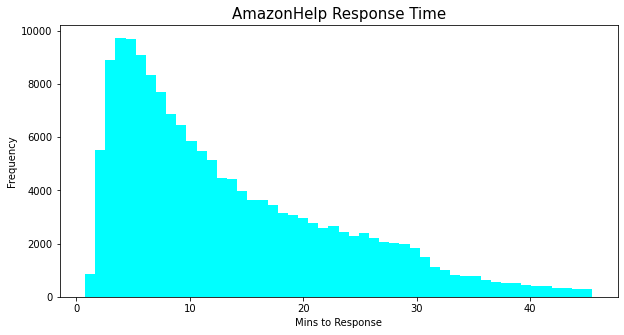

Amazon's average response time is 13.44 minutes.


In [34]:
#trying to looking for and exclude any outliers.

amazon = sla[sla['author_id_x'] == 'AmazonHelp']
amazon_times = amazon['converted_time']

amazon_times.dropna()

def remove_outlier(amazon_times):
    q1 = amazon_times.quantile(0.25)
    q3 = amazon_times.quantile(0.75)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    df_out = amazon_times.loc[(amazon_times > fence_low) & (amazon_times < fence_high)]
    return df_out

no_outliers = remove_outlier(amazon_times)

plt.figure(figsize=(10,5))
hist_plot = no_outliers.plot.hist(bins=50,color='#00ffffff')
hist_plot.set_title('AmazonHelp Response Time',fontsize=15)
hist_plot.set_xlabel('Mins to Response',fontsize=10)
hist_plot.set_ylabel('Frequency',fontsize=10)

plt.show()

print('Amazon\'s average response time is ' + str(round(no_outliers.mean(),2)) + ' minutes.' )


__Short summary__ :

Amazon's average response time is around 13 mins. So this is around their service level agreement (SLA) for Twitter support and this is the response time that Amazon's staff to.

It can be the baseline of SLA. And when the tweet volumn are high in Oct, Nov and Dec. The SLA should be shorter than 14 mins. 

## EDA : examine the the users and the number of tweets - Who create the tweets ? 

In [35]:
#from the first 5 columns, we can see than the same user has the multiple tweets
#examine the number of tweet requested by the same author_id
#author_id 169172 is an outlier who has created 447 tweets 

amazon_request.author_id.value_counts()[:1000]

169172    447
326613    156
469296    112
158494    100
177530    93 
          .. 
179062    10 
412981    10 
305445    10 
349942    10 
219265    10 
Name: author_id, Length: 1000, dtype: int64

In [36]:
#if we only look at the tweet in 2017,  the number of tweets from authur_id '169172' decreased from 447 to 317.
#there are 144 tweets in 2015 and 2016 in total, 130 out of 144 tweets are created by author_id 169172
#it means that the tweets in 2015 and 2016 are mainly created by this same author_id 
#it is worth to take a look of this case later
amazon_request17.author_id.value_counts()[:1000]

169172    317
326613    156
469296    112
158494    100
177530    93 
          .. 
412981    10 
295644    10 
242309    10 
215402    10 
282889    10 
Name: author_id, Length: 1000, dtype: int64

### Visualizing the number of tweets by the top 30 of the author_id)

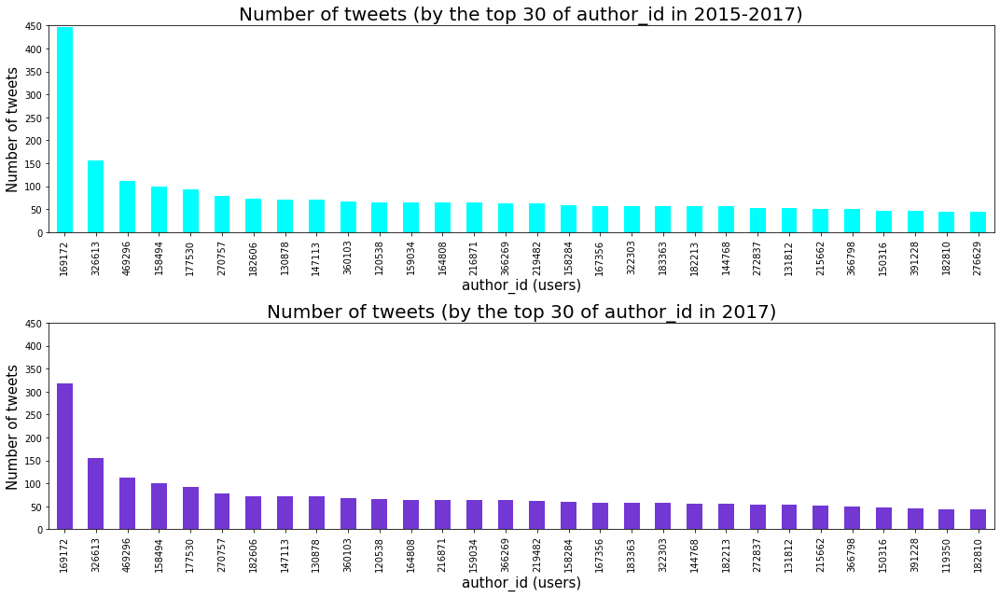

In [39]:
fig = plt.figure(2, figsize=(15,9))

#fontcolor = {'color': 'white'}

ax1 = fig.add_subplot(2, 1, 1)
#plt.figure(figsize=(10,5))
plt.xlabel('author_id (users)',fontsize=15)
plt.ylabel('Number of tweets',fontsize=15)
plt.title ('Number of tweets (by the top 30 of author_id in 2015-2017)',fontsize=20)
amazon_request.author_id.value_counts()[:30].plot(kind='bar',color='#00ffffff')
#ax1.set_facecolor('#002845')
ax1.set_ylim(0, 450)


ax2 = fig.add_subplot(2, 1, 2)
#plt.figure(figsize=(10,5))
plt.xlabel('author_id (users)',fontsize=15)
plt.ylabel('Number of tweets',fontsize=15)
plt.title ('Number of tweets (by the top 30 of author_id in 2017)',fontsize=20)
amazon_request17.author_id.value_counts()[:30].plot(kind='bar', color='#7337d4')
#ax2.set_facecolor('#002845')
ax2.set_ylim(0, 450)


plt.tight_layout()
plt.show()

fig.savefig('tweet.png',transparent=True)   #save for presentation

__Short Summary of the above bar plots__:

If we only look at the tweet in 2017,  the number of tweets from authur_id '169172' decreased from 447 to 317.
there are 144 tweets in 2015 and 2016 in total, 130 out of 144 tweets are created by author_id 169172
it means that the tweets in 2015 and 2016 are mainly created by this same author_id 
it is worth to take a look of this case later.

### Visualized the distribution of number of tweets by the top 1000 author_id

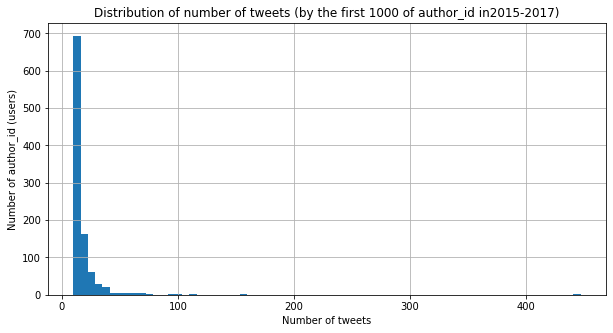

In [40]:
#visualized the distribution of number of tweets by the top 1000 author_id
plt.figure(figsize=(10,5))
amazon_request.author_id.value_counts().head(1000).hist(bins=70)
plt.ylabel('Number of author_id (users)')
plt.xlabel('Number of tweets')
plt.title ('Distribution of number of tweets (by the first 1000 of author_id in2015-2017)')

plt.show()

In [41]:
#average number of users 
amazon_request.author_id.value_counts().mean()

2.5945938460686295

Based on the historgram above, we can see that the distribution of the top 1000 author_id who created the tweets is right skewed. It means the mode are the highest point, median and mean fall to the right. Most of the user created around 2.5 tweets.  

Again, there is an outlier who has created more than 400 tweets. We already know this author_id is 169172. We will dive deeper later. 

In [42]:
#comparing total number of unique tweets in 2015-1017 and solely in 2017 

print(f'There are {amazon_request.text.nunique()} tweets in 2015-2017')
print(f'There are {amazon_request17.text.nunique()} tweets in 2017')

There are 93683 tweets in 2015-2017
There are 93530 tweets in 2017


In [43]:
#comparing total number of unique users in 2015-1017 and solely in 2017

print(f'There are {amazon_request.author_id.nunique()} unique users in 2015-2017')
print(f'There are {amazon_request17.author_id.nunique()} unique users in 2017')

There are 36107 unique users in 2015-2017
There are 36096 unique users in 2017


In [44]:
#comparing the top 5000 users contribution to tweet requests in 2015-1017 and solely in 2017

print(f'The top 5000 users contribution to {amazon_request.author_id.value_counts().head(5000).sum()} tweet requests in 2015-2017')
print(f'The top 5000 users contribution to {amazon_request17.author_id.value_counts().head(5000).sum()} tweet requests in 2017')


The top 5000 users contribution to 41469 tweet requests in 2015-2017
The top 5000 users contribution to 41336 tweet requests in 2017


In [45]:
#comparing the percentage of users contributer to percentage of the tweets in 2015-2017 and solely in 2017

print(f'The top {round((5000/36107)*100 ,2)}% author_id contributed to {round((41469/93683)*100,2)}% tweets in 2015-2017')
print(f'The top {round((5000/36096)*100 ,2)}% author_id contributed to {round((41336/93683)*100,2)}% tweets in 2017')


The top 13.85% author_id contributed to 44.27% tweets in 2015-2017
The top 13.85% author_id contributed to 44.12% tweets in 2017


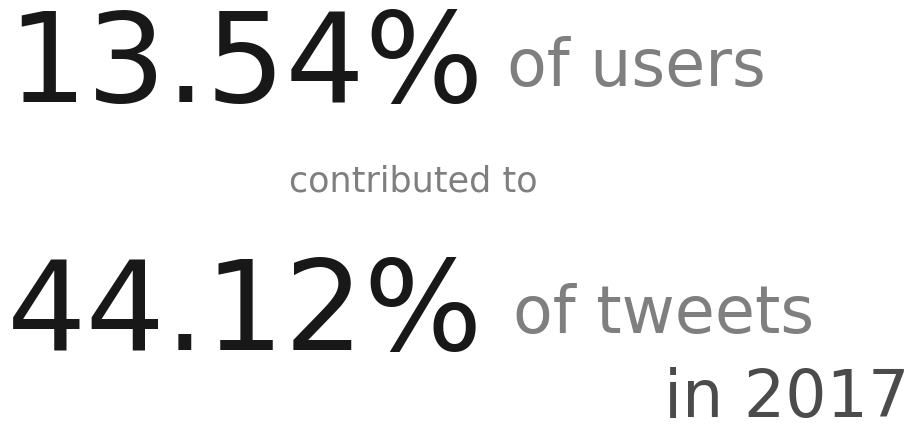

In [46]:
plt.figure(figsize=(10, 7))

# Create text:
# x = horizontal axis 
# y = vertical axis
# s = stating the percent(s means string)
# ha center = center-aligned horizontally
# va center = center-aligned vertically
# size = font size
# alpha = 0.9 = 10% opaque; 90% clear

plt.text(x = 0.1,
         y = 0.9,
         s = '13.54%',
         ha = 'center',
         va = 'center',
         size = 125,
         alpha = 0.9)

plt.text(x = 0.8,
         y = 0.9,
         s = 'of users',
         ha = 'center',
         va = 'center',
         size = 65,
         alpha = 0.5)
         
plt.text(x = 0.4,
         y = 0.6,
         s = 'contributed to',
         ha = 'center',
         va = 'center',
         size = 35,
         alpha = 0.5)

plt.text(x = 0.1,
         y = 0.25,
         s = '44.12%',
         ha = 'center',
         va = 'center',
         size = 125,
         alpha = 0.9)

plt.text(x = 0.85,
         y = 0.25,
         s = 'of tweets',
         ha = 'center',
         va = 'center',
         size = 65,
         alpha = 0.5)

plt.text(x = 1.07,
         y = 0.03,
         s = 'in 2017',
         ha = 'center',
         va = 'center',
         size = 65,
         alpha = 0.7)

plt.axis('off');

__Short summary__

The finding above match with the trend of what we saw from the histogram. It means that majority of users (around 86%) contribute to 56% of tweets. We can assume that unique users do not retweet or make another tweet.

I can come up with 2 implciations based on my 10 years experience in the customer service industry :
1. Their issues can be resolved by some troubleshoot steps (first time resolution) or being taking care of Amazon's representative. For example, users are refered to provide more info via email.
2. Users are frustrated and give up on tweet support and that's why they don't bother to reply or follow up. In this scenario, I will not be able to cover in this project. I will take note and for future work like performing Sentiment analysis.


### The story of outliers - author_id 169172
Let 's take a closer look to the author_id 169172
Basically this user was requesging a discount because the product he ordered had a price drop half day after he had placed the order. 
He has totally 447 tweets that simply asking for a response from AmazonHelp. 

I will excluded all of his tweets. 


In [47]:
#reading the context of the tweets from author_id 169172
pd.set_option('display.max_colwidth', -1)

outliers = amazon_request[amazon_request['author_id'] ==169172]
outliers.text

created_at
2016-08-17 15:33:17+00:00    Very unhappy with @115830 @AmazonHelp item I ordered sold by Amazon dropped 15~ % 1/2 days after ordering and won't honour price drop
2016-08-18 01:57:28+00:00    @115830 @AmazonHelp Can you help please? Haven't received response                                                                   
2016-08-19 19:14:02+00:00    @115830 @AmazonHelp Can I get some sort of response please, third time asking?                                                       
2016-08-20 20:10:03+00:00    @115830 @AmazonHelp 4th day requesting any kind of response                                                                          
2016-08-21 16:16:38+00:00    @115830 @AmazonHelp 5th day requesting any kind of response                                                                          
                                                        ...                                                                                                       
2017-11-29 

In [48]:
#take a closer look of the request
#total numbers of tweets is 317 (317 rows)
outliers17 = amazon_request17[amazon_request17['author_id'] ==169172]
outliers17

,tweet_id,author_id,inbound,created_at,text,month,year,dayname
created_at,,,,,,,,
2017-01-01 20:11:59+00:00,395072,169172,True,2017-01-01 20:11:59+00:00,@AmazonHelp @115830 136th day requesting any kind of response,Jan,2017,Sunday
2017-01-02 19:08:25+00:00,395073,169172,True,2017-01-02 19:08:25+00:00,@AmazonHelp @115830 137th day requesting any kind of response,Jan,2017,Monday
2017-01-03 18:51:32+00:00,395074,169172,True,2017-01-03 18:51:32+00:00,@AmazonHelp @115830 138th day requesting any kind of response,Jan,2017,Tuesday
2017-01-04 14:16:02+00:00,395075,169172,True,2017-01-04 14:16:02+00:00,@AmazonHelp @115830 139th day requesting any kind of response,Jan,2017,Wednesday
2017-01-05 20:58:07+00:00,395076,169172,True,2017-01-05 20:58:07+00:00,@AmazonHelp @115830 140th day requesting any kind of response,Jan,2017,Thursday
...,...,...,...,...,...,...,...,...
2017-11-29 21:00:27+00:00,395384,169172,True,2017-11-29 21:00:27+00:00,@AmazonHelp @115830 @115851 463rd day requesting any kind of response,Nov,2017,Wednesday
2017-11-30 19:00:12+00:00,395385,169172,True,2017-11-30 19:00:12+00:00,@AmazonHelp @115830 @115851 464th day requesting any kind of response,Nov,2017,Thursday
2017-12-01 19:15:52+00:00,395386,169172,True,2017-12-01 19:15:52+00:00,@AmazonHelp @115830 @115851 465th day requesting any kind of response,Dec,2017,Friday


In [49]:
#Since I will use the tweets in 2017, I will exclude author_id 's tweets 
amazon_request2017 = amazon_request17[(amazon_request17['author_id'] !=169172)]

In [50]:
#ensure outlier is dropped 
amazon_request2017.head()


,tweet_id,author_id,inbound,created_at,text,month,year,dayname
created_at,,,,,,,,
2017-01-03 18:13:30+00:00,2471026,261759,True,2017-01-03 18:13:30+00:00,@AmazonHelp no he recibido nada,Jan,2017,Tuesday
2017-01-03 18:29:39+00:00,2471022,261759,True,2017-01-03 18:29:39+00:00,@AmazonHelp https://t.co/chcr2kxtUv,Jan,2017,Tuesday
2017-01-06 02:21:37+00:00,1284481,420466,True,2017-01-06 02:21:37+00:00,Why is @AmazonHelp on twitter when all they do is apologize and ask you to repeat yourself. @420465,Jan,2017,Friday
2017-01-24 15:40:49+00:00,1691621,207103,True,2017-01-24 15:40:49+00:00,@AmazonHelp Gave correct answers still lost. Unlucky me.,Jan,2017,Tuesday
2017-01-25 05:49:23+00:00,1691603,513483,True,2017-01-25 05:49:23+00:00,@AmazonHelp but i think their is no fair rule for winner draw. I played whole day &amp; gave my best to win but from now i will not play,Jan,2017,Wednesday


__Short summry__:
 
After examing when were the tweets create and who created the tweets, I will exclude the followings :
- tweets in 2015 and 2016 
- tweets created by the outlier author_id 169172

The name of the new datafram is `amazon_request2017`

In [51]:
#have a first glacnce of the new data frame
#no null value
amazon_request2017.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 93213 entries, 2017-01-03 18:13:30+00:00 to 2017-12-03 23:11:37+00:00
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype              
---  ------      --------------  -----              
 0   tweet_id    93213 non-null  int64              
 1   author_id   93213 non-null  int64              
 2   inbound     93213 non-null  bool               
 3   created_at  93213 non-null  datetime64[ns, UTC]
 4   text        93213 non-null  object             
 5   month       93213 non-null  object             
 6   year        93213 non-null  object             
 7   dayname     93213 non-null  object             
dtypes: bool(1), datetime64[ns, UTC](1), int64(2), object(4)
memory usage: 5.8+ MB


In [52]:
#checking the shape of the final dataframe
amazon_request2017.shape

(93213, 8)

In [53]:
#export to csv as a backup
amazon_request2017.to_csv('./datasets/amazon_request_2017.csv', index=False)

## EDA - examine what are the content of the tweets - What are the top words ?

Before examining the content and looking for the the top words, I will firstly clean the data and then detect the non english tweet again.

### Data cleaning 

In [54]:
#random pick some tweets to have a glacne of the text for data cleaning
#to understand what need to be removed
#as tweet content are short, will check with the 60-100 tweets
pd.set_option('display.max_colwidth', -1)

amazon_request2017.text[60:100]

created_at
2017-06-12 06:43:25+00:00    @AmazonHelp Yup. I don't understand why this is so hard! Why can't I sell on Amazon?                                                                            
2017-06-14 10:36:55+00:00    @AmazonHelp Hello, just wanted to remind you on Kannada support and content on @117634 and @119625. When can I buy Kannada ebooks?                              
2017-06-15 12:29:19+00:00    @AmazonHelp See earlier response: "NO - it's a shared account with my wife. Why do I need it?"                                                                  
2017-06-17 04:04:41+00:00    @AmazonHelp @115851 No @AmazonHelp  have replied. I seldom log in here but I 'll make sure I do give u a knock everytime I log in should u not heed to ur cstmrs
2017-06-18 02:55:11+00:00    @AmazonHelp Bttr late dan nvr, glad dat u folks heeded 2 me. Refund as gift card was d bare minimal. have shared my fdbck hope things 'd get better  :)         
2017-06-18 16:44:59+00:00    @AmazonHel

from the above text, I will remove :
- contractions e.g 'wasn't' will be changed to 'was not'
- uppercase letter
- html
- punctuation

In [55]:
#define a function to clean the text
def clean_data(text):
    text = str(text)    #make sure every text is string 
    text = contractions.fix(text)      #convert contraction words
    text = re.sub('\w*\d\w*', '', text) #remove words contain digtial 
    text = re.sub(r'https?:\/\/.*\/\w*', '', text) # Remove hyperlinks
    text = re.sub(r'\&\w*;', '', text)  #remove HTML symbols
    text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text) #make a list of punctuation remove at once
    text = re.sub(r'\s\s+', ' ', text)  #remove '/n' and white space
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text) #remove all single character
    text = text.lower().split()
    #text = re.sub(r'[%s]' % re.escape(string.punctuation), '', text) #make a list of punctuation remove at once
    return( " ".join(text))
 


In [56]:
#making a new columns for the cleaned text 

amazon_request2017['clean_text'] = [x for x in amazon_request2017['text'].apply(clean_data)]
amazon_request2017['clean_text'] = [x for x in amazon_request2017['text'].apply(clean_data)]

In [57]:
#check if the clean_data function is in effect

pd.set_option('display.max_colwidth', -1)

amazon_request2017.clean_text[60:100]

created_at
2017-06-12 06:43:25+00:00    amazonhelp yup do not understand why this is so hard why can not sell on amazon                                                                    
2017-06-14 10:36:55+00:00    amazonhelp hello just wanted to remind you on kannada support and content on and when can buy kannada ebooks                                       
2017-06-15 12:29:19+00:00    amazonhelp see earlier response no it is shared account with my wife why do need it                                                                
2017-06-17 04:04:41+00:00    amazonhelp no amazonhelp have replied seldom log in here but will make sure do give you knock everytime log in should you not heed to ur cstmrs    
2017-06-18 02:55:11+00:00    amazonhelp bttr late dan nvr glad dat you folks heeded me refund as gift card was bare minimal have shared my fdbck hope things would get better   
2017-06-18 16:44:59+00:00    amazonhelp tried logging into my amazon acct for the time in months and can

### Detection of non English tweets 

Now I will detect the non english tweets again. 

In [58]:
#reset index for easier locating the non english tweets
amazon_request2017= amazon_request2017.reset_index(drop=True)

In [59]:
#make sure this sample dataframe contains non english tweets for testing 
#found non english tweets
#index 93168    amazonhelp ei amazon pra onde mando email pra pedir umas melhoras no app do
#index 93198    amazonhelp grazie gentilissimi peccato che sia la prima volta che apro il kindle appena comprato                                                                                                                                                                                     

amazon_request2017.tail(50)

,tweet_id,author_id,inbound,created_at,text,month,year,dayname,clean_text
93163,579864,256570,True,2017-12-03 22:13:36+00:00,@AmazonHelp Well that's sketchy. Charging someone with a different name than is on the account.. no it is still on there. I thought it would be safe but apparently I was wrong.,Dec,2017,Sunday,amazonhelp well that is sketchy charging someone with different name than is on the account no it is still on there thought it would be safe but apparently was wrong
93164,602228,195452,True,2017-12-03 22:13:45+00:00,"@AmazonHelp I've already had a prime membership. What I've been sent in the post is another 3- day free prime. However, I can't see anywhere on the website to go to redeem this as it's wanting me to pay immediately.",Dec,2017,Sunday,amazonhelp have already had prime membership what have been sent in the post is another day free prime however can not see anywhere on the website to go to redeem this as it is wanting me to pay immediately
93165,598999,262064,True,2017-12-03 22:14:25+00:00,@AmazonHelp Your customer service call centre is a disgrace. I called and was kept on the phone for 40 min with a lady at the other end who could not understand my issue and did nothing to resolve my@problem #BoycottAmazon,Dec,2017,Sunday,amazonhelp your customer service call centre is disgrace called and was kept on the phone for min with lady at the other end who could not understand my issue and did nothing to resolve myproblem boycottamazon
93166,601324,262653,True,2017-12-03 22:15:51+00:00,@AmazonHelp So you don't want to help resolve the issue then ? Had no call back and all your said that is helpful is send the link to cancel the account,Dec,2017,Sunday,amazonhelp so you do not want to help resolve the issue then had no call back and all your said that is helpful is send the link to cancel the account
93167,603212,263292,True,2017-12-03 22:17:51+00:00,@AmazonHelp No I received emails for all 3 parcels to say they were out for delivery,Dec,2017,Sunday,amazonhelp no received emails for all parcels to say they were out for delivery
93168,603193,263284,True,2017-12-03 22:18:10+00:00,"@AmazonHelp Ei Amazon, pra onde mando e-mail pra pedir umas melhoras no app do @263285 ?",Dec,2017,Sunday,amazonhelp ei amazon pra onde mando email pra pedir umas melhoras no app do
93169,602236,262956,True,2017-12-03 22:18:28+00:00,"@AmazonHelp I appreciate your understanding. I was counting on that order being delivered on the original date, and that day was ruined, because of the failure to deliver. Afraid apologies are not enough, in this situation. Especially with all the effort it has taken to get to this point.",Dec,2017,Sunday,amazonhelp appreciate your understanding was counting on that order being delivered on the original date and that day was ruined because of the failure to deliver afraid apologies are not enough in this situation especially with all the effort it has taken to get to this point
93170,603177,263269,True,2017-12-03 22:19:14+00:00,"@AmazonHelp I've waited all day for my parcel and no delivery, what is the point of having Prime membership if you are not able to fulfil it",Dec,2017,Sunday,amazonhelp have waited all day for my parcel and no delivery what is the point of having prime membership if you are not able to fulfil it
93171,593389,260496,True,2017-12-03 22:19:59+00:00,@AmazonHelp @AmazonHelp ?,Dec,2017,Sunday,amazonhelp amazonhelp
93172,603191,150316,True,2017-12-03 22:20:21+00:00,@AmazonHelp I have placed the order! But did not get the instant discount! When do I get my refund of 1500? https://t.co/c7Yhwntg5R,Dec,2017,Sunday,amazonhelp have placed the order but did not get the instant discount when do get my refund of


In [60]:
#create a small subset of data for debug and test the function of detecting non english tweet
#i.e shorter running time pd.set_option('display.max_columns', None)

clean50 = amazon_request2017['clean_text'].tail(50)
clean50

93163    amazonhelp well that is sketchy charging someone with different name than is on the account no it is still on there thought it would be safe but apparently was wrong                                                                                                                
93164    amazonhelp have already had prime membership what have been sent in the post is another day free prime however can not see anywhere on the website to go to redeem this as it is wanting me to pay immediately                                                                       
93165    amazonhelp your customer service call centre is disgrace called and was kept on the phone for min with lady at the other end who could not understand my issue and did nothing to resolve myproblem boycottamazon                                                                    
93166    amazonhelp so you do not want to help resolve the issue then had no call back and all your said that is helpful is send the link t

In [61]:
#filitering the non english tweets and append them to the non eng list 
non_eng=[]
for x in clean50:
    if detect(x) != 'en':
        non_eng.append(x)
    else:
        continue

In [62]:
#checking the non eng list 
non_eng

['amazonhelp ei amazon pra onde mando email pra pedir umas melhoras no app do',
 'amazonhelp amazonhelp',
 'amazonhelp',
 'amazonhelp grazie gentilissimi peccato che sia la prima volta che apro il kindle appena comprato',
 'amazonhelp',
 'amazonhelp amazon mktpl']

__Short summay from language detect testing on subset:__

We can see that the tweets are spotted. 
Try on all text. 


In [63]:
all_text = amazon_request2017['clean_text']

In [64]:
non_eng=[]
for x in all_text:
    if detect(x) != 'en':
        non_eng.append(x)
    else:
        continue

In [65]:
len(non_eng)

12410

In [66]:
#checking the non eng list 
non_eng[1000:1500]

['amazonhelp ok thanks',
 'amazonhelp no point talking to you guys',
 'amazonhelp no effect still same problem even after reinstall',
 'amazonhelp thanks amazonhelp keep being awesome',
 'amazonhelp link invalid',
 'amazonhelp help',
 'amazonhelp do have job still or no',
 'amazonhelp',
 'amazonhelp am deeply disapponted',
 'amazonhelp done',
 'amazonhelp',
 'amazonhelp filled',
 'amazonhelp apki apni farzi dukaan worst delivery ever',
 'amazonhelp thanxactualmente calculo que el las hago con vuestro servicio satisfecho el tan por precio como por celeridad servicio post',
 'amazonhelp ich habe ein problem mit einem headset das ich am september bestellt habe und am dezember schon ausgetauscht wurde',
 'amazonhelp is far far better than amazonhelp',
 'amazonhelp not yet but status say not deliverable order id',
 'amazonhelp same cost product is not available',
 'amazonhelp form filled at pm',
 'amazonhelp',
 'amazonhelp issue solved thanks amazonhelp',
 'amazonhelp help',
 'amazonhelp ye

__Dilemma : should I use the langauge detection ?__ 

From the above result, we can see that the language detection filter out 12360 non english rows. But when we look into
the non english list, some tweets are actually English tweets but was mis-dectected. The language detection seems not quite accurate when dealing with large data.

My judgement is not to remove any rows at this stage. It is because the english tweets are still in majority in the 93K rows. I believe after three different ways of pre processing, the noise of non english will be minimized. I will see the outputs of topic modelings and to determined further action at that point. 

#### A second thought : What if I drop them ?

Okay...long story short. I have run the first LDA and the result are affected by the non english tweets. So I am back to here and drop the non english tweets. 

I will use the language detection to filter the eng list and run the three pre processing again.
But I will not rerun the top wordd and word clouds. 


In [67]:
eng_lst =[]
for x in tqdm(all_text):
    if detect(x) == 'en':
        eng_lst.append(x)
    else:
        continue

In [68]:
#I have 93213 originally,now I have dropped around 12K tweets after filtering
len(eng_lst)

80880

### Pre-Processing for LDA model

Here we come to the Data preprocessing. This is one of the critical steps in any machine learning project.

I will perform 3 pre-processing with different libraries after the data cleaning and handling the non english tweets. Since cleaning stopwords and specific languae can be very challenging for getting the most out of LDA. I am trying different ways to massaging the data into the best shape possible for the modelings and to avoid as much noise involved with the model as I can.

The first pre-processing will be done by SpaCy custom pipelines. I will elaborate in the section tilted : `First way pre-processing - SpaCy pipeline`. The output will be saved as pickle file named `doc_spacyall`

The second pre-processing will be NLTK and bigram/trigram by gensim models.phrases. I will elaborate in the section tilted : `Second way pre-processing - NLTK and gensim bigram/trigram`. The output will be saved as pickle file named `doc_nltk_bitri`

The third pre-processing will be a function `tweet_cleaning` defined specially to deal with the tweets chating pattern. Since this is a Twitter dataset,I will remove some substrings commonly used on the platform like the hashtag, retweet marks, and hyperlinks by use regular expression.Besides, Twitter-aware tokenizer will be used, it is designed to be flexible and easy to adapt to new domains and tasks.
I will elaborate in the section tilted : `Third way pre-processing - Tweet_cleaning function`. The output will be saved as pickle file named `doc_clean_tweet`

## First way pre-processing - SpaCy 

Now I have got a cleaned text. In the first round of pre processing, I will use SpaCy custom pipelines which includes the default tagger,parser and ner (Name Entity Recognizer) together with 2 of the functions for lemmatizer and spacy stop words packages. 

SpaCy is powerful as it can be used to perform tasks like vocabulary and phrase matching.

SpaCy processing pipeline : 

![Alt text](https://spacy.io/pipeline-7a14d4edd18f3edfee8f34393bff2992.svg)


image source : https://spacy.io/usage/processing-pipelines

Then I find the top 30 words. I will see if the top words are providing insight. If there are any meaningless words, I will add them into the stop words list. These new stop words list will be use in the second and third way of pre-processing. 

In [69]:
#look at the stop words to see if there is any words that needs to be removed from the stop words
stopwordspc = spacy.lang.en.stop_words.STOP_WORDS

print('Number of stop words: %d' % len(stopwordspc))
print('Spacy stop words: %s' % list(stopwordspc))

Number of stop words: 326
Spacy stop words: ['above', 'were', 'hereupon', 'just', 'amount', 'than', 'via', 'you', 'every', 'rather', 'sometimes', 'less', 'our', 'in', 'never', 'must', 'hereby', 'meanwhile', 'up', 'against', 'through', 'per', 'elsewhere', 'from', 'yet', 'several', 'even', 'everyone', "n't", 'made', 'once', 'seemed', 'whose', 'show', 'therefore', 'ca', 'empty', 'is', 'make', 'whole', 'really', 'take', 'three', 'i', 'regarding', 'he', 'about', 'always', 'herein', 'formerly', 'his', 'whom', 'on', 'am', 'others', 'afterwards', 'to', 'only', 'are', 'at', 'together', 'anything', 'namely', 'thru', "'ve", 'part', 'though', 'was', 'wherever', "'d", 'before', 'whither', 'sixty', 'what', '’s', 'and', 'can', 'done', 'themselves', 'under', 'here', 'below', 'still', 'hundred', 'will', 'along', 'cannot', 'twenty', 'thereby', 'latter', 'nor', 'or', 'down', 'serious', 'over', "'m", 'across', 'when', 'the', 'few', 'anyone', 'now', 'any', 'whereupon', 'this', 'has', 'been', 'fifty', 'then

In [70]:
nlp= spacy.load("en_core_web_sm")

# As every tweets start from tagging 'amazonhelp', and will freqenctly mentioned 'amazon' ,
#add  these two words into my stop words list
stop_list = ['amazonhelp','amazon']


# Updates spaCy's default stop words list with my additional words. 
for w in stop_list:
    nlp.vocab[w].is_stop = True


In [71]:
def lemmatizer(doc):
    # This takes in a doc of tokens from the NER and lemmatizes them. 
    # the Pronouns will be lemmatized to '-PRON-', for example, "I" will displayed as -PRON- because it is 'normalized'
    # will exclude '-PRON-'
    # 'is', 'are' will displayed as 'be',will keep it for now 
    doc = [token.lemma_ for token in doc if token.lemma_ != '-PRON-']
    doc = u' '.join(doc)
    return nlp.make_doc(doc)
    
def remove_stopwords(doc):
    # Use token.text to return strings for running gensim later
    # remove the stopwords

    doc = [token.text for token in doc if not token.is_stop]
    return doc


# The add_pipe function is to add on the above 2 functions to the default pipeline : tagger, paser and ner
#ret
#reference : https://explosion.ai/blog/spacy-v2-pipelines-extensions
#https://spacy.io/usage/spacy-101
nlp.add_pipe(lemmatizer,name='lemmatizer',after='ner')    #Named Entity Recognition
nlp.add_pipe(remove_stopwords, name="stopwords", last=True)


In [72]:
#reassign the clean_text as request_doc, prepare for document list 
request_doc = amazon_request2017['clean_text']

In [73]:
request_doc[:10]

0    amazonhelp no he recibido nada                                                                                                          
1    amazonhelp                                                                                                                              
2    why is amazonhelp on twitter when all they do is apologize and ask you to repeat yourself                                               
3    amazonhelp gave correct answers still lost unlucky me                                                                                   
4    amazonhelp but think their is no fair rule for winner draw played whole day gave my best to win but from now will not play              
5    amazonhelp hi want to lease out my place to amazon for pudo pls suggest the concerned person                                            
6    amazonhelp try for response this morning                                                                                                
7    a

In [74]:
#checking how big my document is 
request_doc.shape

(93213,)

#### Processing for the first output : Run the custom pipelines, lemmatizer and stop words

In [152]:
#show the progress bar of loading by tqdm
doc_spacyall= []
# Iterates through each article in the corpus.
for doc in tqdm(request_doc):
    # pass the tweet requests through the custom pipeline and then add to doc_list
    pr = nlp(doc)
    doc_spacyall.append(pr)

#### Processing for the sceond output : englist list with custom pipelines (after the running the first LDA model)

In [206]:
#show the progress bar of loading by tqdm
doc_spacyen= []
# Iterates through each article in the corpus.
for doc in tqdm(eng_lst):
    # pass the tweet requests through the custom pipeline and then add to doc_list
    pr = nlp(doc)
    doc_spacyen.append(pr)

#### First output : pickle file named 'doc_spacyall'

In [153]:
#save doc_list to pickle,avoid runing the pipeline every time

filename= 'doc_spacyall'
outfile = open(filename,'wb')
pickle.dump(doc_spacyall,outfile)
outfile.close()

#### second output : pickle file named 'doc_spacyen'

In [207]:
filename= 'doc_spacyen'
outfile = open(filename,'wb')
pickle.dump(doc_spacyen,outfile)
outfile.close()

# Top words - Pre-Processing 1 by SpaCy 

After saving the output, I will proceed with finding the top words. 
I will create wordcloud and bar plot of top words for each pre preprocessing method.

In [154]:
#remove nested list to a flat list
#reference : https://www.geeksforgeeks.org/python-convert-a-nested-list-into-a-flat-list/

output_list = []

def remove_nested_list(nested_list): 
    for i in nested_list: 
        if type(i) == list: 
            remove_nested_list(i) 
        else: 
            output_list.append(i)

In [193]:
doc_spacyall

[['recibido', 'nada'],
 [],
 ['twitter', 'apologize', 'ask', 'repeat'],
 ['correct', 'answer', 'lose', 'unlucky'],
 ['think',
  'fair',
  'rule',
  'winner',
  'draw',
  'play',
  'day',
  'good',
  'win',
  'play'],
 ['hi',
  'want',
  'lease',
  'place',
  'pudo',
  'pls',
  'suggest',
  'concerned',
  'person'],
 ['try', 'response', 'morning'],
 ['manchest',
  'logistic',
  'depot',
  'min',
  'away',
  'car',
  'annoy',
  'collect',
  'prime',
  'experience',
  'failure'],
 ['arrive',
  'tomorrow',
  'yesterday',
  'morning',
  'arrive',
  'tomorrow',
  'message',
  'track',
  'local'],
 ['logistic',
  'cust',
  'servcs',
  'mean',
  'contact',
  'want',
  'escalate',
  'complaint',
  'far',
  'lip',
  'service'],
 ['affiliate', 'close', 'fault'],
 ['order',
  'iphone',
  'day',
  'deliveryphn',
  'rcvd',
  'fake',
  'message',
  'unavailabilitynot',
  'deliver'],
 ['provide', 'detail', 'wait', 'response'],
 ['day', 'order', 'deliver', 'wrong'],
 ['ihv',
  'share',
  'feedback',
  

In [156]:
#remove nested list to a flat list from spacy lemmatizer and stopwords  
remove_nested_list(doc_spacyall)

In [157]:
#checking if the nested_list is removed 
output_list[:100]

['recibido',
 'nada',
 'twitter',
 'apologize',
 'ask',
 'repeat',
 'correct',
 'answer',
 'lose',
 'unlucky',
 'think',
 'fair',
 'rule',
 'winner',
 'draw',
 'play',
 'day',
 'good',
 'win',
 'play',
 'hi',
 'want',
 'lease',
 'place',
 'pudo',
 'pls',
 'suggest',
 'concerned',
 'person',
 'try',
 'response',
 'morning',
 'manchest',
 'logistic',
 'depot',
 'min',
 'away',
 'car',
 'annoy',
 'collect',
 'prime',
 'experience',
 'failure',
 'arrive',
 'tomorrow',
 'yesterday',
 'morning',
 'arrive',
 'tomorrow',
 'message',
 'track',
 'local',
 'logistic',
 'cust',
 'servcs',
 'mean',
 'contact',
 'want',
 'escalate',
 'complaint',
 'far',
 'lip',
 'service',
 'affiliate',
 'close',
 'fault',
 'order',
 'iphone',
 'day',
 'deliveryphn',
 'rcvd',
 'fake',
 'message',
 'unavailabilitynot',
 'deliver',
 'provide',
 'detail',
 'wait',
 'response',
 'day',
 'order',
 'deliver',
 'wrong',
 'ihv',
 'share',
 'feedback',
 'pl',
 'chk',
 'believe',
 'management',
 'aware',
 'happen',
 'grnd',


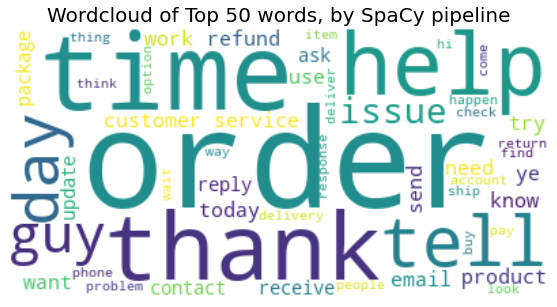

In [158]:
#convert from list to string for plotting wordcloud
doc_spacyall_str = " ".join(output_list)
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=50, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(doc_spacyall_str )
# Visualize the word cloud
wordcloud.to_image()
plt.figure(figsize=(10,5))
plt.title ('Wordcloud of Top 50 words, by SpaCy pipeline', fontsize =20)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()


In [159]:
#find the top 30 words for spacy lemmatizer and stopwords  
word_freq = Counter(output_list)
common_words = word_freq.most_common(30)
print (common_words)

[('order', 14588), ('delivery', 9306), ('day', 8418), ('time', 7506), ('deliver', 7305), ('customer', 6682), ('email', 6488), ('thank', 6332), ('prime', 5689), ('service', 5636), ('help', 5420), ('today', 4930), ('item', 4657), ('send', 4299), ('receive', 4248), ('tell', 4208), ('refund', 4203), ('product', 4170), ('issue', 3867), ('need', 3856), ('want', 3782), ('package', 3748), ('account', 3677), ('wait', 3518), ('contact', 3475), ('try', 3275), ('know', 3133), ('guy', 3072), ('yes', 2997), ('use', 2959)]


In [160]:
#converting the common words into dateframe for ploting (for spacy lemmatizer and stopwords)
common_words_df = pd.DataFrame(common_words, columns =['words', 'count']) 
common_words_df.head()

,words,count
0,order,14588
1,delivery,9306
2,day,8418
3,time,7506
4,deliver,7305


In [161]:
#define a function for plotting word count
#Top 30 words(for SpaCy lemmatizer and stopwords
#'#00cfcc'

def word_count_plot (df,title,color):
    plt.figure(figsize=(15,9))
    ax1 = sns.barplot(data=df, x= "count", y = "words", color=color)
    #plt.tick_params(axis='y', which='both', labelleft=False, labelright=True)
    plt.xlabel('Count',fontsize=15)
    #plt.ylabel('Words',fontsize=15)
    plt.title (title,fontsize=20)
    
    plt.tight_layout()
    plt.show()
    


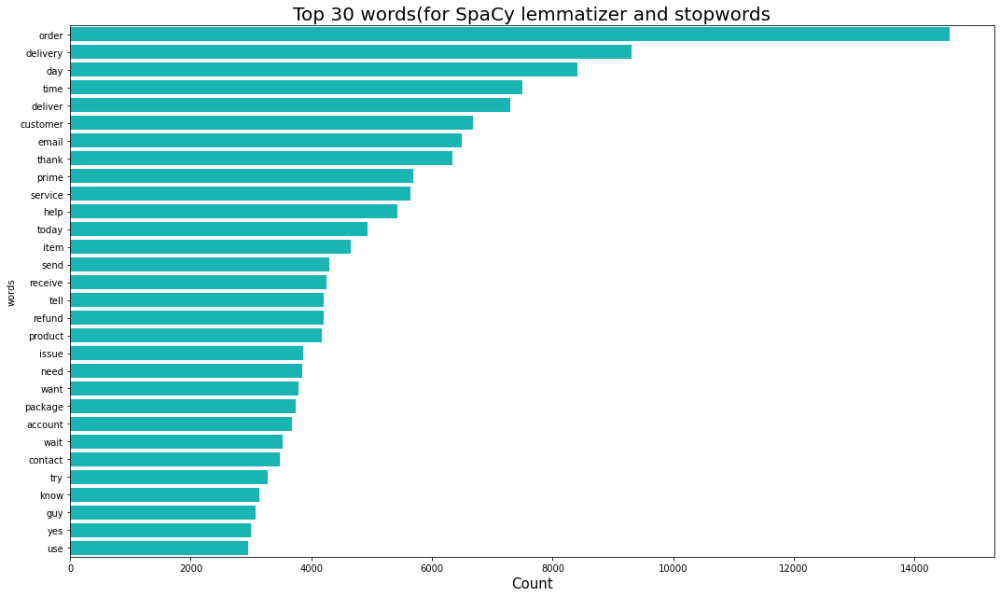

In [162]:
title = 'Top 30 words(for SpaCy lemmatizer and stopwords'
word_count_plot(common_words_df,title,'#00cfcc')

In [163]:
#add new stopwords
stopwords_new =['amazonhelp','amazon','day','thank','help','today','tell','need','want',
                'try','know','guy','yes','use']


From the top words above, we can see that words like 'day', 'need','want' do not bring insights. I have add more words into the stop words list named. These new stop words list will be use in the second and third way of pre-processing. 

## Second way pre-processing - NLTK and gensim bigram/trigram

In the second round of pre processing, I will use NLTK stop wrods and gensim bigram/trigram stop words packages together with SpaCy Parts of Speech (POS) Tagging.

I will find the top 30 words and will see if the top words are providing insight. If there are any meaningless words, I will add them into the stop words list. The new stop words list will be use in the last pre-processing. 

In [164]:
#define function to tokenize 
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent) 

In [165]:
#reassign the clean_text as request_doc, prepare for document list 
request_doc_lst = request_doc.values.tolist()
request_doc_w = list(sent_to_words(request_doc_lst))
print(request_doc_w[10])

['amazonhelp', 'my', 'amazon', 'affiliate', 'got', 'closed', 'without', 'any', 'fault', 'of', 'mine']


In [166]:
# Build the bigram and trigram models
#Bigrams are two words frequently occurring together in the document. 
#Trigrams are three words frequently occurring

bigram = gensim.models.Phrases(request_doc_w, min_count=5, threshold=100) # higher threshold fewer phrases.
#get trigrams by using the bigram model that already have and apply to Pgensim.models.Phrases
trigram = gensim.models.Phrases(bigram[request_doc_w], threshold=100)

#To get a sentence grouped as a trigram/bigram faster
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [167]:
#this time i will use nltk stopwords with my new stopwords list 
stop_words = stopwords.words('english')

#adding new stopwords
stop_words.extend(stopwords_new)
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [168]:
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB','ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

doc_clean_words = process_words(request_doc_w) #output is the proceeded text data

In [169]:
#from the list below, we can see there are wordings like revise_payment, kannada_ebook but aren't too many bigram and trigram 
doc_clean_words[:100]

[['recibido', 'nada'],
 [],
 ['twitt', 'apologize', 'ask', 'repeat'],
 ['give', 'correct', 'answer', 'still', 'lose', 'unlucky'],
 ['think',
  'fair',
  'rule',
  'winner',
  'draw',
  'play',
  'whole',
  'give',
  'good',
  'win',
  'play'],
 ['lease', 'place', 'pudo', 'pls', 'suggest', 'concerned', 'person'],
 ['response', 'morning'],
 ['manchester',
  'logistic',
  'depot',
  'min',
  'away',
  'car',
  'annoy',
  'go',
  'collect',
  'prime',
  'experience',
  'failure'],
 ['arrive',
  'tomorrow',
  'yesterday',
  'morning',
  'still',
  'arrive',
  'tomorrow',
  'message',
  'see',
  'track',
  'local'],
 ['logistic',
  'cust',
  'servcs',
  'give',
  'contact',
  'escalate',
  'complaint',
  'far',
  'lip',
  'service'],
 ['affiliate', 'get', 'close', 'fault', 'mine'],
 ['order',
  'iphone',
  'deliveryphn',
  'rcvd',
  'get',
  'fake',
  'message',
  'due',
  'deliver'],
 ['provide', 'detail', 'wait', 'response'],
 ['order', 'deliver', 'yet', 'wrong'],
 ['ihv',
  'share',
  'fe

In [170]:
output_list =[]
remove_nested_list(doc_clean_words)

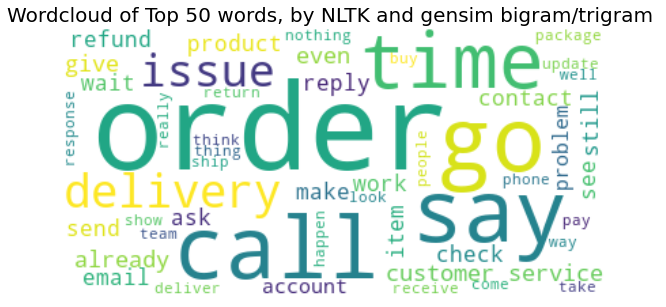

In [171]:
#wordcloud
doc_clean_words_str = " ".join(output_list)
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=50, contour_width=3, contour_color='magenta')
# Generate a word cloud
wordcloud.generate(doc_clean_words_str)
# Visualize the word cloud
wordcloud.to_image()
plt.figure(figsize=(10,5))
plt.title ('Wordcloud of Top 50 words, by NLTK and gensim bigram/trigram ', fontsize =20)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [172]:
#randomly checking on the latest outputlist to see if the nested list has been removed 
output_list[:200]

['recibido',
 'nada',
 'twitt',
 'apologize',
 'ask',
 'repeat',
 'give',
 'correct',
 'answer',
 'still',
 'lose',
 'unlucky',
 'think',
 'fair',
 'rule',
 'winner',
 'draw',
 'play',
 'whole',
 'give',
 'good',
 'win',
 'play',
 'lease',
 'place',
 'pudo',
 'pls',
 'suggest',
 'concerned',
 'person',
 'response',
 'morning',
 'manchester',
 'logistic',
 'depot',
 'min',
 'away',
 'car',
 'annoy',
 'go',
 'collect',
 'prime',
 'experience',
 'failure',
 'arrive',
 'tomorrow',
 'yesterday',
 'morning',
 'still',
 'arrive',
 'tomorrow',
 'message',
 'see',
 'track',
 'local',
 'logistic',
 'cust',
 'servcs',
 'give',
 'contact',
 'escalate',
 'complaint',
 'far',
 'lip',
 'service',
 'affiliate',
 'get',
 'close',
 'fault',
 'mine',
 'order',
 'iphone',
 'deliveryphn',
 'rcvd',
 'get',
 'fake',
 'message',
 'due',
 'deliver',
 'provide',
 'detail',
 'wait',
 'response',
 'order',
 'deliver',
 'yet',
 'wrong',
 'ihv',
 'share',
 'feedback',
 'chk',
 'believe',
 'aware',
 'happen',
 'grnd

In [173]:
#find the top 30 words for process_word function 
word_freq_pw = Counter(output_list)
common_words_pw = word_freq_pw.most_common(30)
print (common_words_pw)

[('order', 14554), ('get', 12243), ('delivery', 9300), ('say', 8709), ('time', 7510), ('deliver', 7297), ('customer', 6658), ('email', 6474), ('call', 5693), ('prime', 5681), ('service', 5616), ('still', 5108), ('item', 4657), ('go', 4555), ('send', 4302), ('receive', 4226), ('product', 4155), ('would', 4145), ('refund', 4080), ('already', 3947), ('issue', 3866), ('package', 3775), ('account', 3677), ('give', 3637), ('wait', 3456), ('contact', 3450), ('take', 3258), ('back', 2985), ('reply', 2915), ('return', 2768)]


In [174]:
#converting the common words into dateframe for ploting (for spacy lemmatizer and stopwords)
common_words_pw_df = pd.DataFrame(common_words_pw, columns =['words', 'count']) 
common_words_pw_df.head()

,words,count
0,order,14554
1,get,12243
2,delivery,9300
3,say,8709
4,time,7510


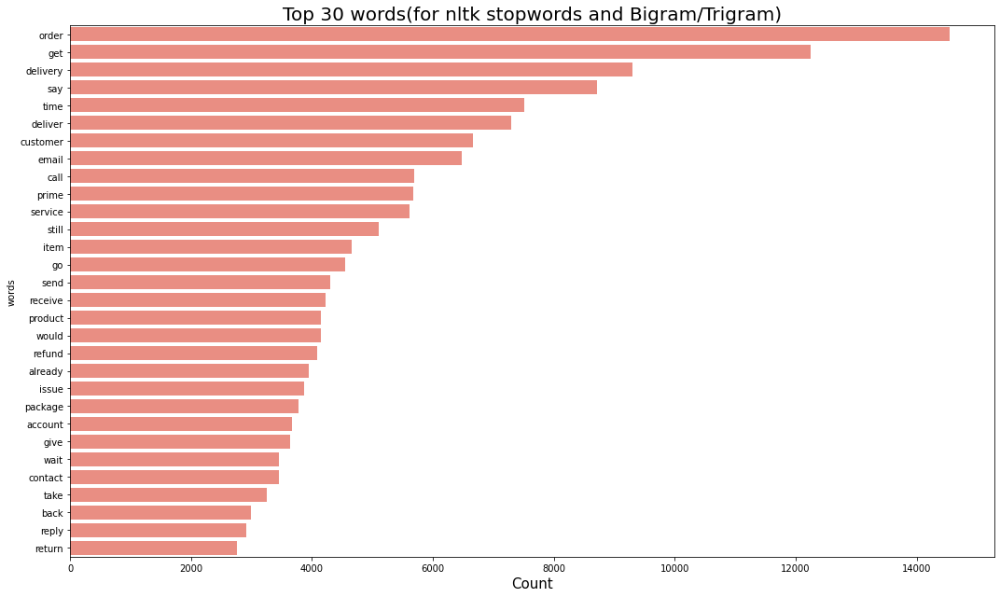

In [175]:
title = 'Top 30 words(for nltk stopwords and Bigram/Trigram)'
word_count_plot(common_words_pw_df,title,'salmon')

In [176]:
#add more stopwords
stopwords_new2 =['amazonhelp','amazon','day','thank','help','today','tell','need','want',
                'try','know','guy','yes','use','get','say','go','would','take','back']


#### Third output: pickle file named `doc_nltk_bitri`

In [177]:
#save doc_list to pickle,avoid runing the pipeline every time

filename= 'doc_nltk_bitri'
outfile = open(filename,'wb')
pickle.dump(doc_clean_words,outfile)
outfile.close()

#### Processing for the Forth output : englist list with nltk and bigram/trigram (after the running the first LDA model)

In [208]:
#apply the process_word function to english list 
doc_clean_en = process_words(eng_lst)

#### Forth output: pickle file named `doc_nltk_en`

In [209]:
#save doc_list to pickle,avoid runing the pipeline every time

filename= 'doc_nltk_en'
outfile = open(filename,'wb')
pickle.dump(doc_clean_en,outfile)
outfile.close()

## Third way pre-processing - Tweet_cleaning function

the function defined specially to deal with the tweets chating pattern. Since this is a Twitter dataset,I will remove some substrings commonly used on the platform like the hashtag, retweet marks, and hyperlinks by use regular expression.Besides, Twitter-aware tokenizer will be used, it is designed to be flexible and easy to adapt to new domains and tasks. 

For the punctuation, it is common that certain expression like ':)' and '...' are used in tweets. these expression should be retained when dealing with tweets because they are used to express emotions. 

#function refering to the following information:
#http://www.nltk.org/api/nltk.tokenize.html#nltk.tokenize.casual.casual_tokenize
#https://gist.github.com/ravikiranj/2639031
#https://towardsdatascience.com/creating-the-twitter-sentiment-analysis-program-in-python-with-naive-bayes-classification-672e5589a7ed

In [179]:
#Make sure the new stop words has been added
stopwords_en = stopwords.words('english')
stopwords_en.extend(stopwords_new2)
print(stopwords_en)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [181]:
#reset the index from datetime. easier to convert to string as the tweet_cleaning function
request_tweet = amazon_request2017['clean_text'].reset_index(drop=True)

In [182]:
#ensure the index is reset
request_tweet.head()

0    amazonhelp no he recibido nada                                                                                            
1    amazonhelp                                                                                                                
2    why is amazonhelp on twitter when all they do is apologize and ask you to repeat yourself                                 
3    amazonhelp gave correct answers still lost unlucky me                                                                     
4    amazonhelp but think their is no fair rule for winner draw played whole day gave my best to win but from now will not play
Name: clean_text, dtype: object

In [183]:
def tweet_cleaning (tweet):
    """Process tweet function.
    Input:
        tweet: a string containing a tweet
    Output:
        tweets_clean: a list of words containing the processed tweet

    """
    stemmer = PorterStemmer()
    stopwords_en = stopwords.words('english')
    stopwords_en.extend(stopwords_new2)

    # remove old style retweet text "RT"
    tweet = re.sub(r'^RT[\s]+', '', tweet)
    # remove hyperlinks
    tweet = re.sub(r'https?:\/\/.*[\r\n]*', '', tweet)
    # remove hashtags
    # only removing the hash # sign from the word
    tweet = re.sub(r'#', '', tweet)
    # tokenize tweets
    tokenizer = TweetTokenizer(preserve_case=False, strip_handles=True,
                               reduce_len=True)
    tweet_tokens = tokenizer.tokenize(tweet)

    tweets_clean = []
    for word in tweet_tokens:
        if (word not in stopwords_en and  # remove stopwords
                word not in string.punctuation):  # remove punctuation
            # tweets_clean.append(word)
            stem_word = stemmer.stem(word)  # stemming word
            tweets_clean.append(stem_word)

    return tweets_clean


In [184]:
#applying the function to clean text
doc_clean_tweet = [x for x in request_tweet.apply(tweet_cleaning)]

In [185]:
#checking the output
doc_clean_tweet[:10]

[['recibido', 'nada'],
 [],
 ['twitter', 'apolog', 'ask', 'repeat'],
 ['gave', 'correct', 'answer', 'still', 'lost', 'unlucki'],
 ['think',
  'fair',
  'rule',
  'winner',
  'draw',
  'play',
  'whole',
  'gave',
  'best',
  'win',
  'play'],
 ['hi', 'leas', 'place', 'pudo', 'pl', 'suggest', 'concern', 'person'],
 ['respons', 'morn'],
 ['manchest',
  'logist',
  'depot',
  'min',
  'away',
  'car',
  'annoy',
  'collect',
  'prime',
  'experi',
  'failur'],
 ['arriv',
  'tomorrow',
  'yesterday',
  'morn',
  'still',
  'arriv',
  'tomorrow',
  'messag',
  'see',
  'track',
  'local'],
 ['logist',
  'cust',
  'servc',
  'give',
  'mean',
  'contact',
  'escal',
  'complaint',
  'far',
  'lip',
  'servic']]

In [186]:
#unpacking the nested list
output_list =[]
remove_nested_list(doc_clean_tweet)

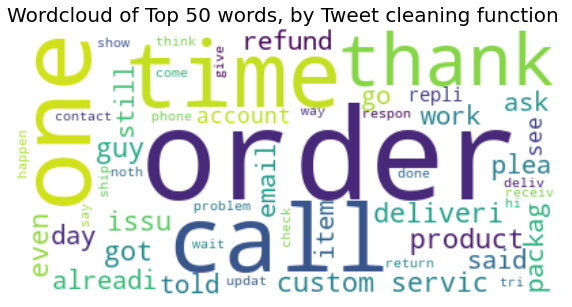

In [187]:
clean_tweet_str = " ".join(output_list)
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=50, contour_width=3, contour_color='#eeefff')
# Generate a word cloud
wordcloud.generate(clean_tweet_str)
# Visualize the word cloud
wordcloud.to_image()
plt.figure(figsize=(10,5))
plt.title ('Wordcloud of Top 50 words, by Tweet cleaning function ', fontsize =20)
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [188]:
#find the top 30 words for tweet_cleaning function 
word_freq_tweet = Counter(output_list)
common_words_tweet = word_freq_tweet.most_common(30)
print (common_words_tweet)

[('order', 14628), ('deliveri', 9310), ('time', 7560), ('deliv', 7318), ('custom', 6729), ('email', 6494), ('call', 5719), ('prime', 5690), ('servic', 5646), ('still', 5108), ('one', 4924), ('say', 4713), ('item', 4657), ('pleas', 4417), ('receiv', 4273), ('refund', 4221), ('product', 4176), ('thank', 4096), ('day', 4075), ('packag', 4022), ('alreadi', 3947), ('issu', 3870), ('got', 3807), ('account', 3714), ('ship', 3639), ('contact', 3540), ('wait', 3537), ('even', 2954), ('repli', 2948), ('cancel', 2852)]


In [189]:
#converting the common words into dateframe for ploting (for spacy lemmatizer and stopwords)
common_words_tweet_df = pd.DataFrame(common_words_tweet, columns =['words', 'count']) 
common_words_tweet_df.head()

,words,count
0,order,14628
1,deliveri,9310
2,time,7560
3,deliv,7318
4,custom,6729


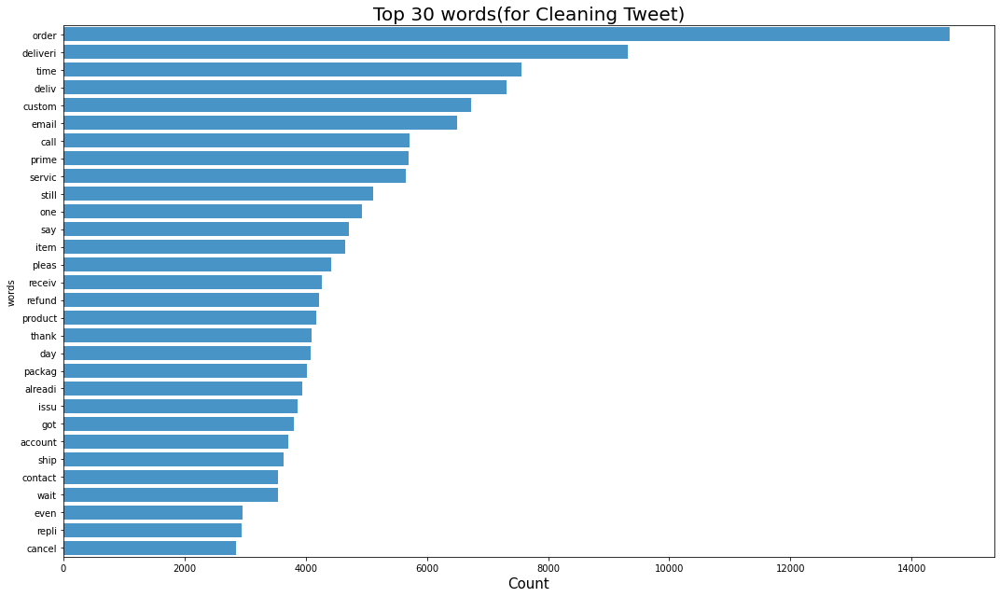

In [190]:
title ='Top 30 words(for Cleaning Tweet)'
word_count_plot (common_words_tweet_df,title,'#3498db')

#### Fifth output: pickle file named `doc_clean_tweet`

In [191]:
#save doc_list to pickle,avoid runing the pipeline every time

filename= 'doc_clean_tweet'
outfile = open(filename,'wb')
pickle.dump(doc_clean_tweet,outfile)
outfile.close()

#### Processing for the sixth output : englist list with tweet cleaning function (after the running the first LDA model)

In [215]:
#applying the tweet cleaning function to english list 
doc_clean_tweet_en = [tweet_cleaning(x) for x in eng_lst]

#### Sixth output: pickle file named `doc_clean_tweet_en`

In [216]:
filename= 'doc_clean_tweet_en'
outfile = open(filename,'wb')
pickle.dump(doc_clean_tweet_en,outfile)
outfile.close()

### Summary of the pre processing 

After the 3 different types of pre processing,there are 6 outputs in total :


1.doc_spacyall

2.doc_spacyen

3.doc_nltk_bitri

4.doc_nltk_en

5.doc_clean_tweet

6.doc_clean_tweet_en